#### **Import Modules**

In [1]:
import csv
import numpy as np
import pandas as pd
import collections
import matplotlib.pyplot as plt
!pip install pyyaml==5.4.1
import plotly.express as px
import time
!pip install geopandas
import seaborn as sns
from scipy import stats
import statistics
%matplotlib inline
import geopandas as gpd

In [2]:
pip install pandas-profiling

In [3]:
!pip install MarkupSafe==2.0.1 --user

#### **Import Dataset and Generate Prelimiary Reports**

In [2]:
Dist_df_1=pd.read_csv("02_District_wise_crimes_committed_against_ST_2001_2012.csv")
Dist_df_2=pd.read_csv("02_District_wise_crimes_committed_against_ST_2013.csv")

Dist_df_crimes_final=pd.concat([Dist_df_1,Dist_df_2])
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0
819,Lakshadweep,ZZ TOTAL,2013,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,0,0,0,0,0,0,0,0,0
821,Puducherry,PUDUCHERRY,2013,0,0,0,0,0,0,0,0,0,0


In [3]:
Dist_df_crimes_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9841 entries, 0 to 822
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   STATE/UT                              9841 non-null   object
 1   DISTRICT                              9841 non-null   object
 2   Year                                  9841 non-null   int64 
 3   Murder                                9841 non-null   int64 
 4   Rape                                  9841 non-null   int64 
 5   Kidnapping Abduction                  9841 non-null   int64 
 6   Dacoity                               9841 non-null   int64 
 7   Robbery                               9841 non-null   int64 
 8   Arson                                 9841 non-null   int64 
 9   Hurt                                  9841 non-null   int64 
 10  Protection of Civil Rights (PCR) Act  9841 non-null   int64 
 11  Prevention of atrocities (POA) 

In [4]:
from pandas_profiling import ProfileReport

C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1

In [5]:
profile=ProfileReport(Dist_df_crimes_final, title="’Crimes against ST’", html={"style":{"full_width":True}})

In [6]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile.to_file(output_file="Crimes_Against_ST_2001_2013")

C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\ydata_profiling\profile_report.py:360: UserWarning: Extension  not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### **Check for the presence of 'NULL'  in the data**

In [8]:
Dist_df_crimes_final.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping Abduction                    0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Protection of Civil Rights (PCR) Act    0
Prevention of atrocities (POA) Act      0
Other Crimes Against STs                0
dtype: int64

#### **Dataset Minor Modifications**

In [9]:
Dist_df_crimes_final.shape

(9841, 13)

In [10]:
for x in Dist_df_crimes_final["DISTRICT"].unique():
    if "total" in str(x).lower():
        Dist_df_crimes_final=Dist_df_crimes_final.drop(list(Dist_df_crimes_final[Dist_df_crimes_final["DISTRICT"]==x].index))

In [11]:
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,Delhi UT,STF,2013,0,0,0,0,0,0,0,0,0,0
816,Delhi UT,WEST,2013,0,0,0,0,0,0,0,0,0,0
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,0,0,0,0,0,0,0,0,0


In [12]:
Dist_df_crimes_final.shape

(9312, 13)

In [13]:
#add Cols
Dist_df_crimes_final["Total"]=Dist_df_crimes_final["Murder"]
for x in range(4,len(Dist_df_crimes_final.columns)-1):
    Dist_df_crimes_final["Total"]+=Dist_df_crimes_final[Dist_df_crimes_final.columns[x]]

In [14]:
Dist_df_crimes_final

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13,18
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6,14
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0,2
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0,4
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,Delhi UT,STF,2013,0,0,0,0,0,0,0,0,0,0,0
816,Delhi UT,WEST,2013,0,0,0,0,0,0,0,0,0,0,0
818,Lakshadweep,LAKSHADWEEP,2013,0,0,0,0,0,0,0,0,0,0,0
820,Puducherry,KARAIKAL,2013,0,0,0,0,0,0,0,0,0,0,0


In [15]:
Dist_df_crimes_final.shape

(9312, 14)

#### **General Geomap Observation**

In [16]:
df_geo_total=Dist_df_crimes_final[['STATE/UT','Total']]
df_geo_total

,STATE/UT,Total
0,ANDHRA PRADESH,18
1,ANDHRA PRADESH,14
2,ANDHRA PRADESH,2
3,ANDHRA PRADESH,4
4,ANDHRA PRADESH,14
...,...,...
815,Delhi UT,0
816,Delhi UT,0
818,Lakshadweep,0
820,Puducherry,0


In [17]:
shp_gdf = gpd.read_file("India_State_Boundary.shp")

In [18]:
shp_gdf.head(5)

,State_Name,geometry
0,Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034..."
1,Chandigarh,"POLYGON ((8546255.616 3606050.813, 8546315.400..."
2,Daman and Diu and Dadra and Nagar Haveli,"MULTIPOLYGON (((8122247.822 2312434.407, 81223..."
3,Delhi,"POLYGON ((8583390.570 3359116.190, 8583476.212..."
4,Haryana,"POLYGON ((8524318.539 3516490.865, 8524451.392..."


In [19]:
shp_gdf.columns

Index(['State_Name', 'geometry'], dtype='object')

In [20]:
merge =shp_gdf.set_index('State_Name').join(df_geo_total.set_index('STATE/UT'))
merge

,geometry,Total
Andaman & Nicobar,"MULTIPOLYGON (((10341718.474 1449533.161, 1034...",NaN
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",40.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",13.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",0.0
Andhra Pradesh,"POLYGON ((9426056.496 2174632.352, 9426228.484...",30.0
...,...,...
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",0.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",1.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",0.0
West Bengal,"POLYGON ((9800305.279 3151090.311, 9800377.779...",0.0


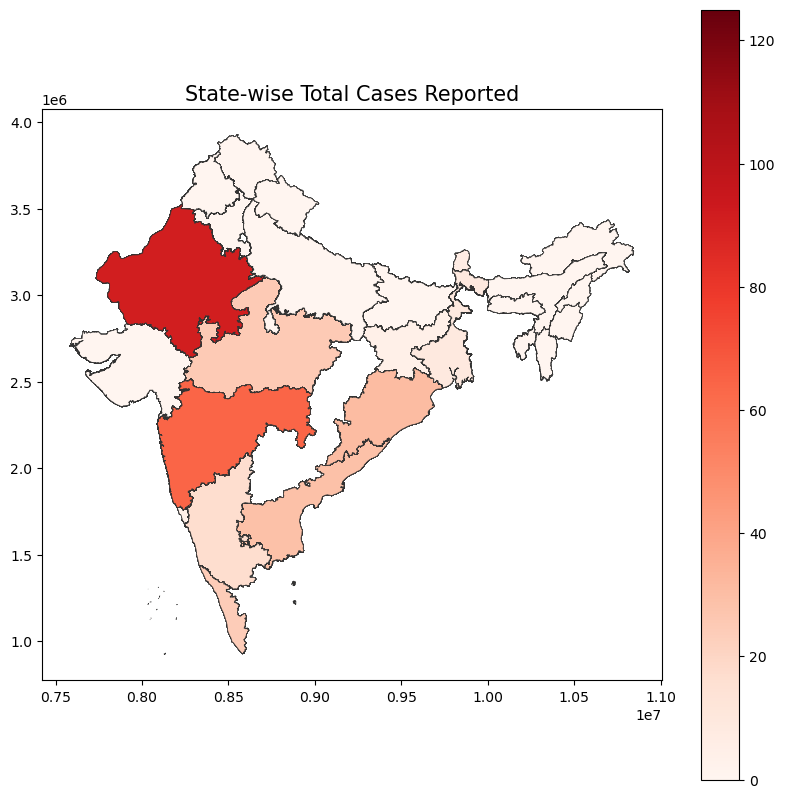

In [21]:
fig,ax=plt.subplots(1, figsize=(10,10))

ax.set_title('State-wise Total Cases Reported',
             fontdict={'fontsize': '15', 'fontweight' : '3'})
fig = merge.plot(column='Total', cmap='Reds', linewidth=0.5, ax=ax, edgecolor='0.2',legend=True)
plt.show()

#### **Yearly Analysis**

Text(0.5, 1.0, 'No of Cases vs Year')

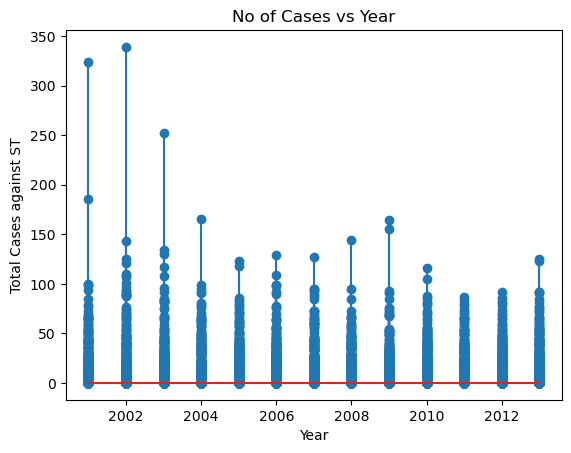

In [22]:
plt.stem(Dist_df_crimes_final.Year,Dist_df_crimes_final.Total)
plt.ylabel('Total Cases against ST')   
plt.xlabel('Year')
plt.title('No of Cases vs Year')

<Axes: xlabel='Year'>

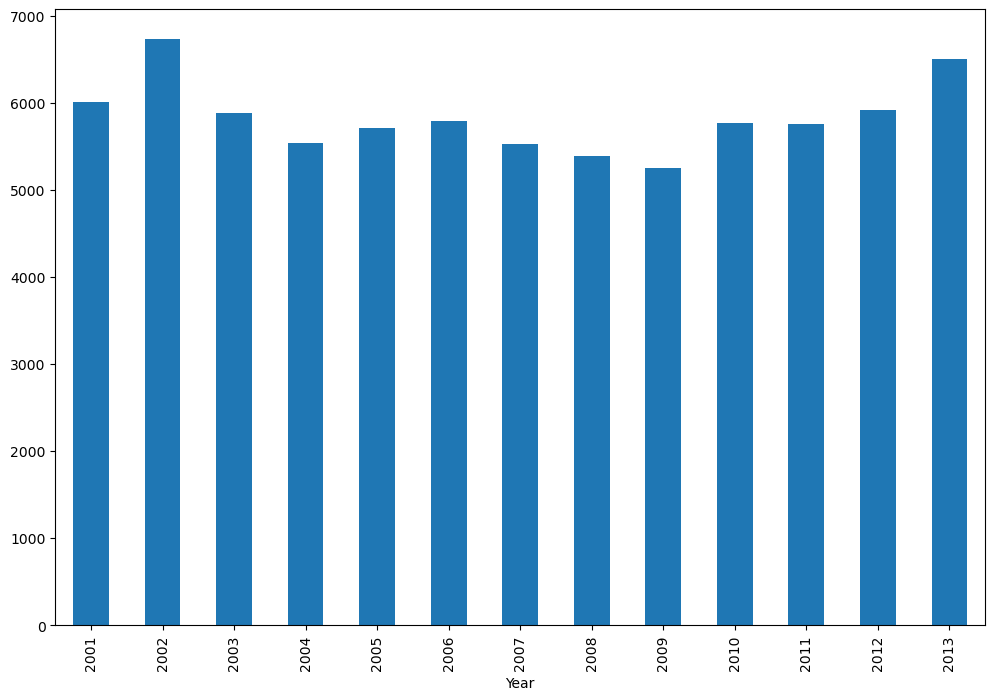

In [23]:
plt.figure(figsize=(12,8))
Dist_df_crimes_final.groupby("Year")["Total"].sum().plot.bar()

C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\3044060855.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\3044060855.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\3044060855.py:3: FutureWarning: The default value of numeric_only in D

C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\3044060855.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')
C:\Users\Vipinchi Nidhi\AppData\Local\Temp\ipykernel_2204\3044060855.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
C:\Users\Vipinchi Nidhi\anaconda3\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figure

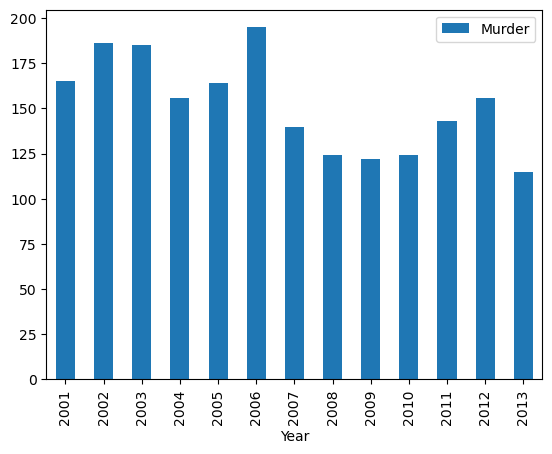

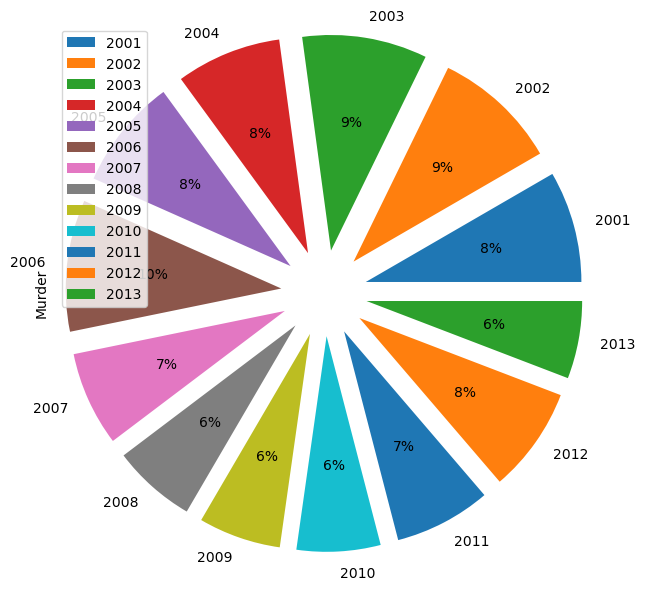

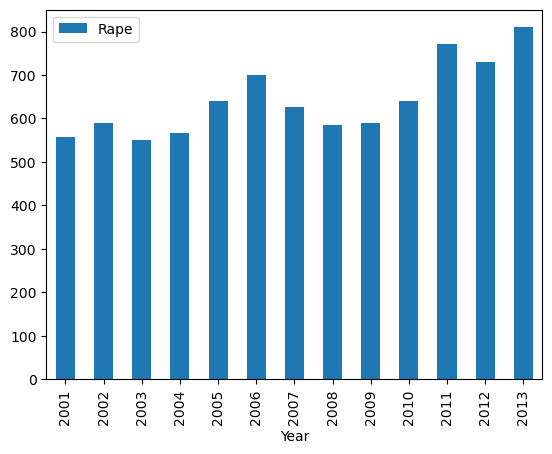

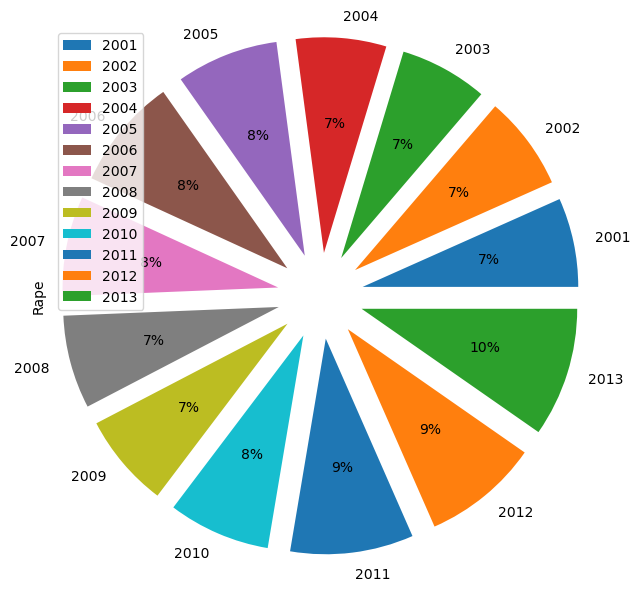

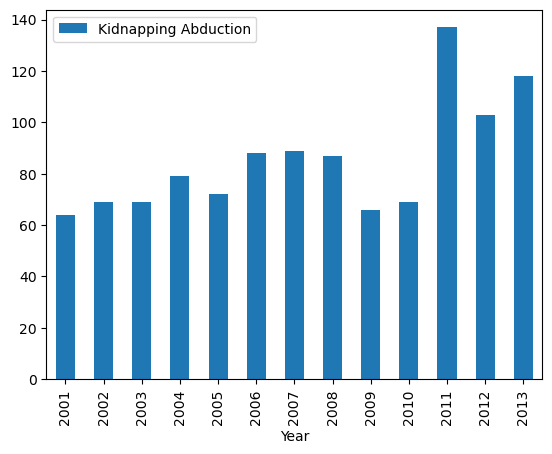

...

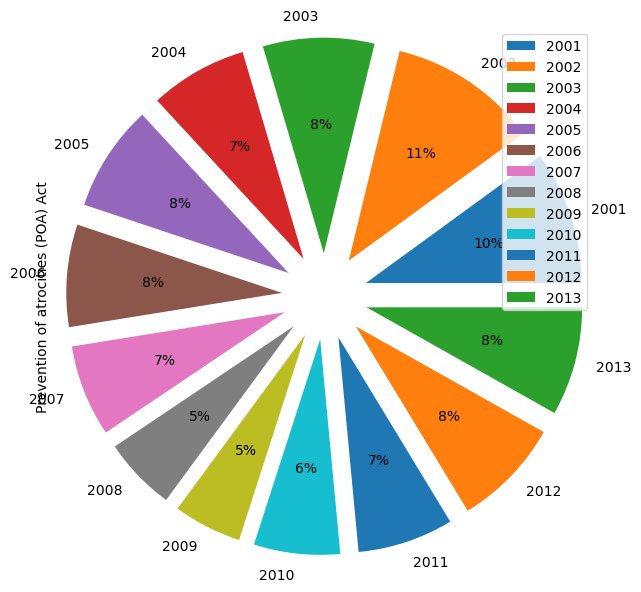

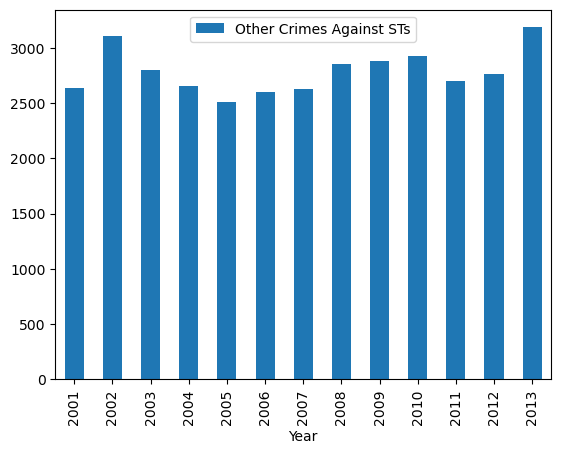

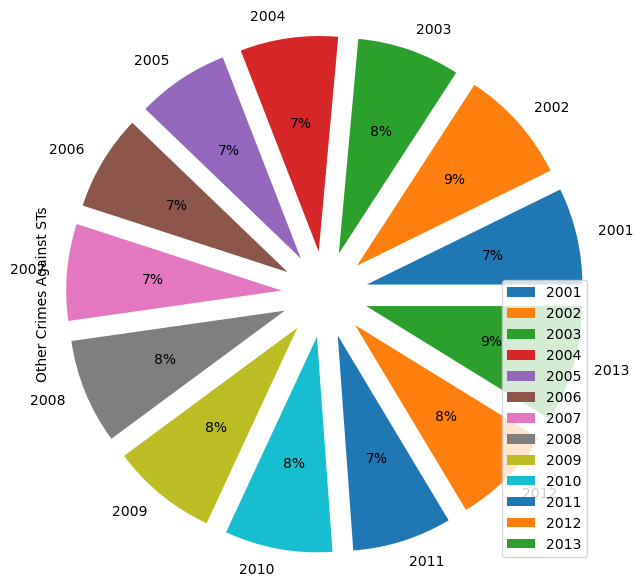

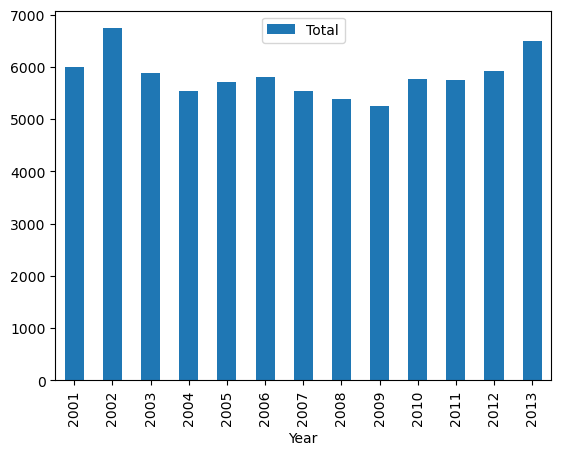

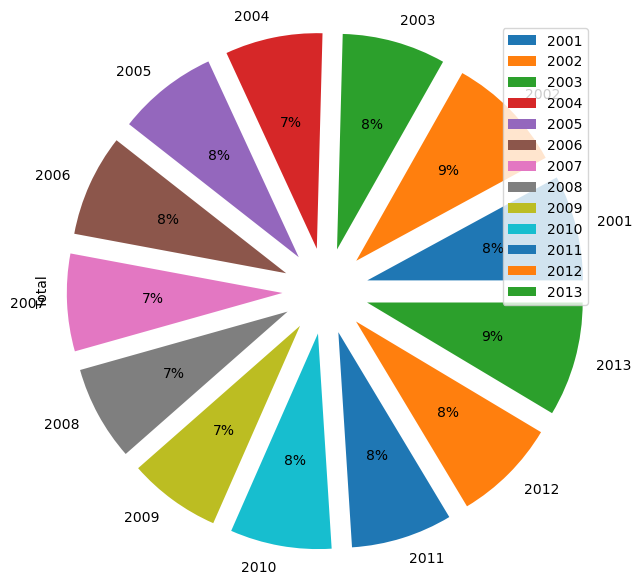

In [24]:
explode=[0.2 for x in range(len(Dist_df_crimes_final['Year'].unique()))]
for col in range(3,len(Dist_df_crimes_final.columns)):
    Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='bar', y=Dist_df_crimes_final.columns[col])
    Dist_df_crimes_final.groupby(['Year']).sum().plot(kind='pie', y=Dist_df_crimes_final.columns[col],explode=explode,figsize=(7,7),autopct='%1.0f%%')

### Categorical yearly crime rates

In [25]:
crimes=Dist_df_crimes_final.columns[3:-1]
Dist_df_crimes_sub=pd.DataFrame()
for i in crimes:
    df_c=Dist_df_crimes_final.groupby(['Year'])[i].sum()
    Dist_df_crimes_sub[i]=df_c
Dist_df_crimes_sub

,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs
Year,,,,,,,,,,
2001,165,558,64,15,69,108,727,56,1609,2634
2002,186,590,69,37,62,58,788,44,1797,3108
2003,185,551,69,30,46,38,790,37,1340,2798
2004,156,566,79,40,50,33,767,11,1175,2658
2005,164,640,72,27,49,38,767,162,1283,2511
2006,195,701,88,12,29,46,840,49,1232,2604
2007,140,627,89,9,21,54,855,5,1104,2628
2008,124,585,87,13,17,46,777,6,882,2855
2009,122,589,66,3,22,27,715,2,822,2882


### Percentage Distribution of crime type

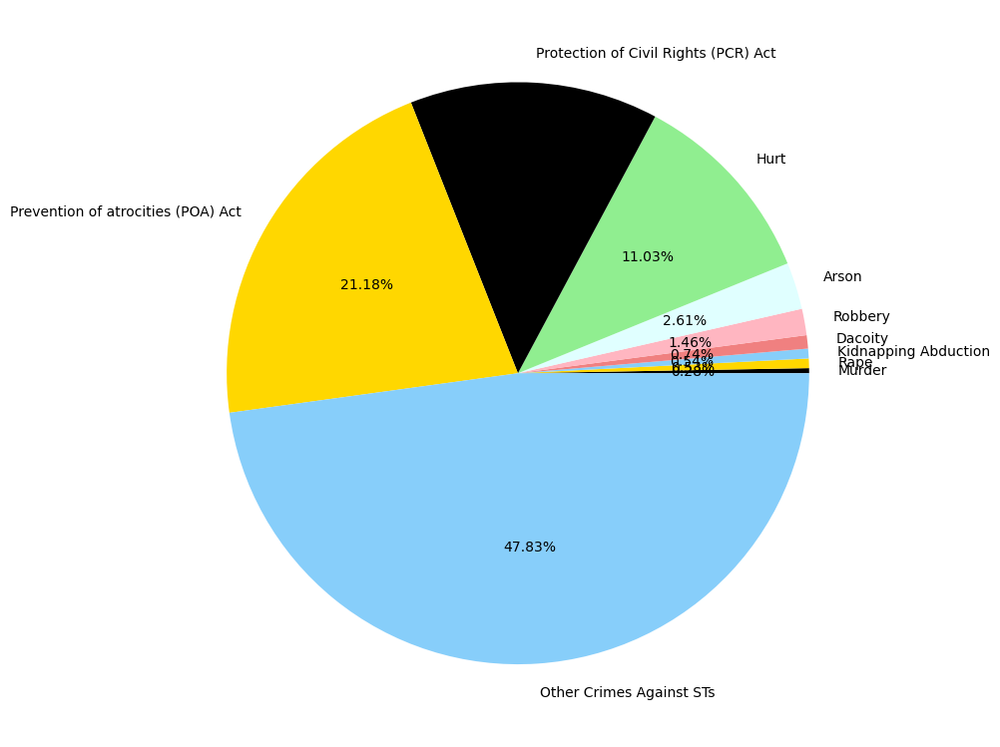

In [26]:
a=[]
explode=[]
for i in crimes:
    a.append(Dist_df_crimes_sub[i].sum())
    explode.append(0.4)
a.sort()
plt.figure(figsize=(10,10))
plt.pie(a,labels=crimes,autopct='%1.2f%%',data=explode,colors=['black', 'gold', 'lightskyblue', 'lightcoral','lightpink','lightcyan','lightgreen'])
plt.tight_layout()

In [27]:
Dist_df_crimes_sub.T

Year,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Murder,165,186,185,156,164,195,140,124,122,124,143,156,115
Rape,558,590,551,566,640,701,627,585,589,640,772,729,810
Kidnapping Abduction,64,69,69,79,72,88,89,87,66,69,137,103,118
Dacoity,15,37,30,40,27,12,9,13,3,7,7,5,7
Robbery,69,62,46,50,49,29,21,17,22,5,9,15,7
Arson,108,58,38,33,38,46,54,46,27,33,24,26,30
Hurt,727,788,790,767,767,840,855,777,715,917,803,816,895
Protection of Civil Rights (PCR) Act,56,44,37,11,162,49,5,6,2,5,7,2,25
Prevention of atrocities (POA) Act,1609,1797,1340,1175,1283,1232,1104,882,822,1037,1154,1311,1309
Other Crimes Against STs,2634,3108,2798,2658,2511,2604,2628,2855,2882,2927,2700,2759,3187


## State / UT wise Analysis of Crime

<Axes: xlabel='STATE/UT'>

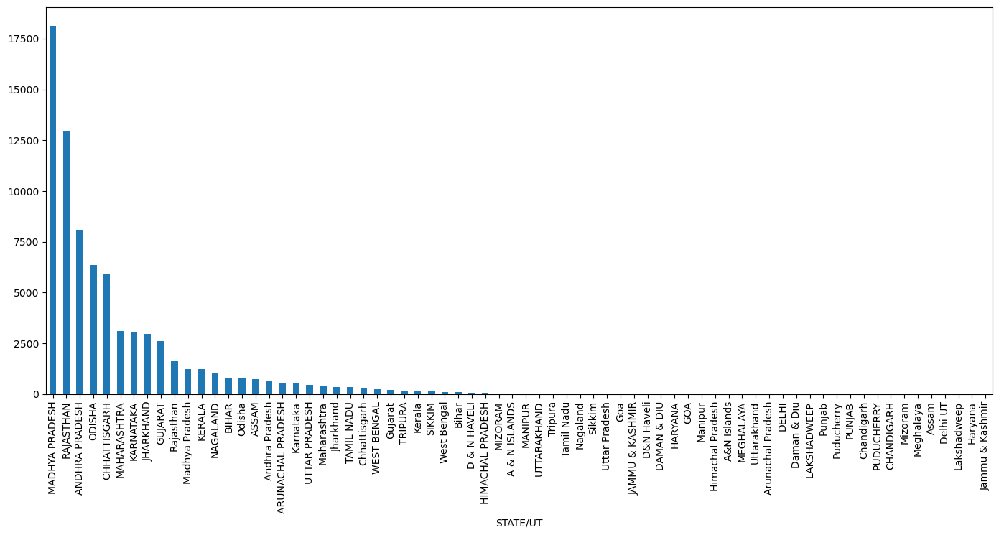

In [28]:
plt.figure(figsize=(17,7))
Dist_df_crimes_final.groupby("STATE/UT")["Total"].sum().sort_values(ascending=False).plot.bar()

In [29]:
df_state=pd.DataFrame()
for i in crimes:
    df_state_crimes=Dist_df_crimes_final.groupby(['STATE/UT'])[i].sum()
    df_state[i]=df_state_crimes
df_state["Total"]=df_state.sum(axis=1)
df_state=df_state.sort_values(by="Total",ascending=False)
df_state.reset_index()
df_state

,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total
STATE/UT,,,,,,,,,,,
MADHYA PRADESH,537,3342,267,6,23,115,2776,3,1683,9390,18142
RAJASTHAN,180,471,71,0,9,113,1391,0,1974,8740,12949
ANDHRA PRADESH,99,451,48,0,3,19,1283,116,2525,3534,8078
ODISHA,106,428,81,6,38,41,985,4,2707,1954,6350
CHHATTISGARH,220,1132,63,16,9,19,620,5,930,2910,5924
...,...,...,...,...,...,...,...,...,...,...,...
Assam,0,0,0,0,0,0,0,0,0,0,0
Delhi UT,0,0,0,0,0,0,0,0,0,0,0
Lakshadweep,0,0,0,0,0,0,0,0,0,0,0


In [30]:
df_state.columns

Index(['Murder', 'Rape', 'Kidnapping Abduction', 'Dacoity', 'Robbery', 'Arson',
       'Hurt', 'Protection of Civil Rights (PCR) Act',
       'Prevention of atrocities (POA) Act', 'Other Crimes Against STs',
       'Total'],
      dtype='object')

### Top 3 States with Higher Number of Crimes

In [31]:
df_state.head(3)

,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total
STATE/UT,,,,,,,,,,,
MADHYA PRADESH,537,3342,267,6,23,115,2776,3,1683,9390,18142
RAJASTHAN,180,471,71,0,9,113,1391,0,1974,8740,12949
ANDHRA PRADESH,99,451,48,0,3,19,1283,116,2525,3534,8078


### 3 States with lower Number of Crimes

In [32]:
df_state.tail(3)

,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total
STATE/UT,,,,,,,,,,,
Lakshadweep,0,0,0,0,0,0,0,0,0,0,0
Haryana,0,0,0,0,0,0,0,0,0,0,0
Jammu & Kashmir,0,0,0,0,0,0,0,0,0,0,0


### Top 5 States Analysis of each Crime

In [33]:
crimes

Index(['Murder', 'Rape', 'Kidnapping Abduction', 'Dacoity', 'Robbery', 'Arson',
       'Hurt', 'Protection of Civil Rights (PCR) Act',
       'Prevention of atrocities (POA) Act', 'Other Crimes Against STs'],
      dtype='object')

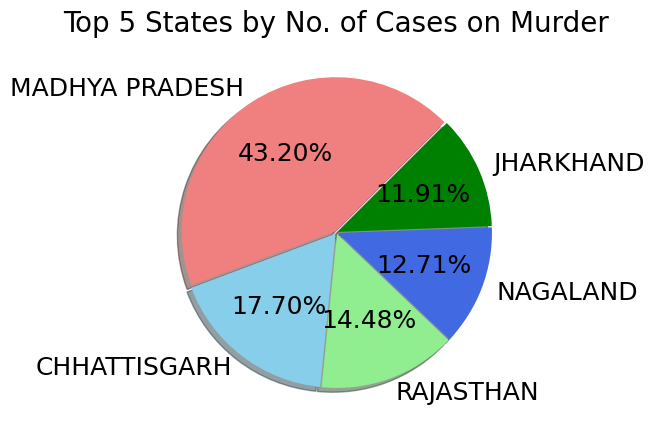

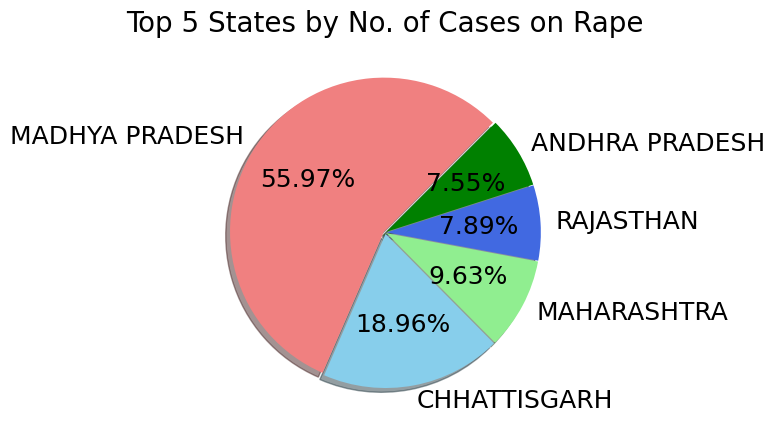

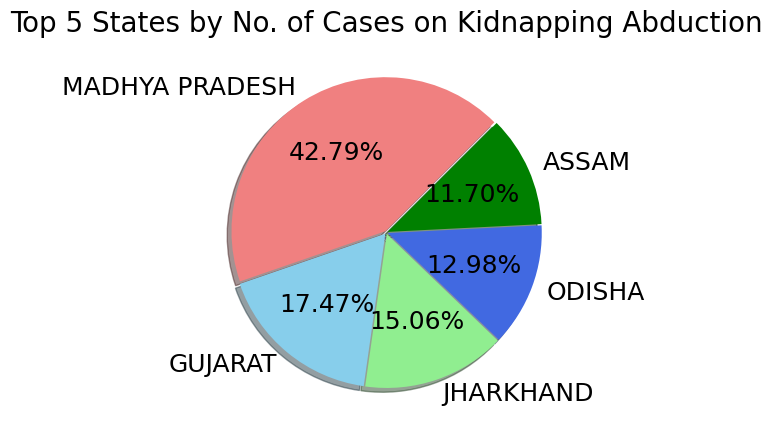

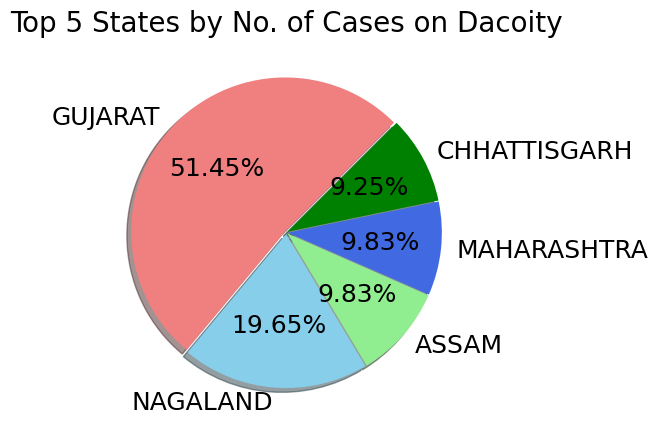

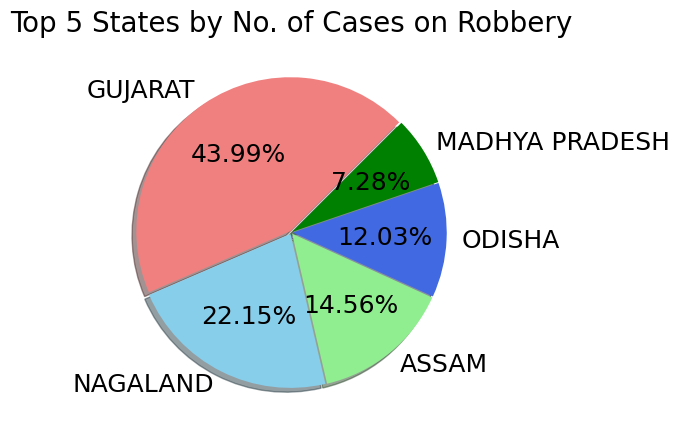

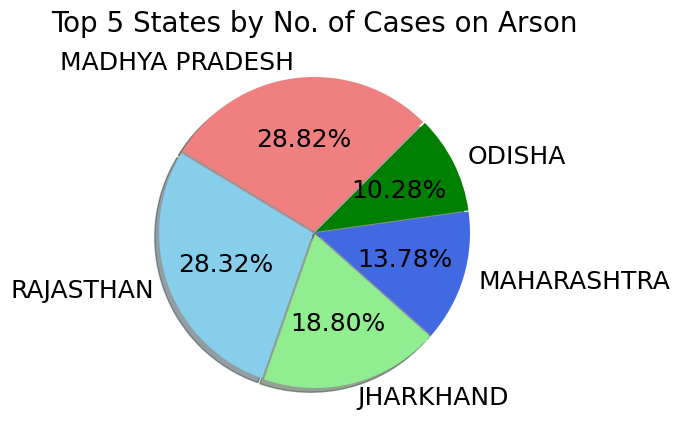

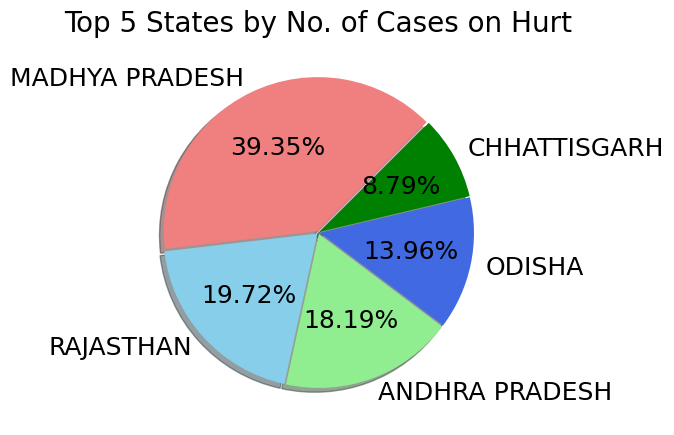

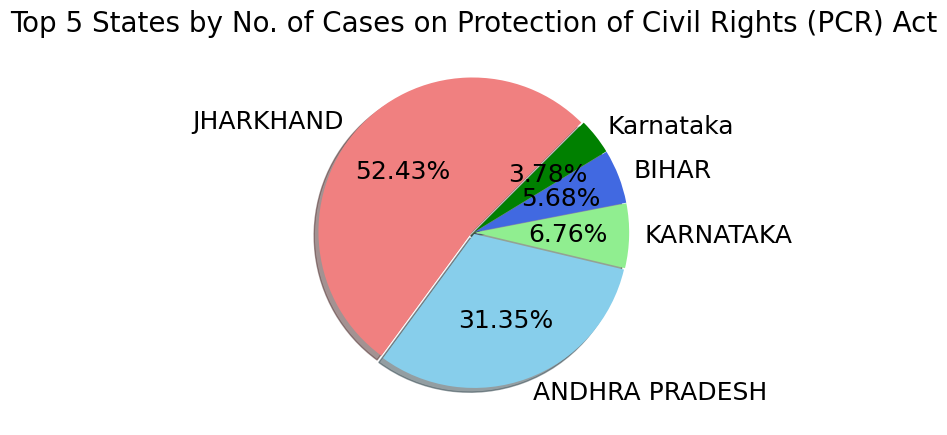

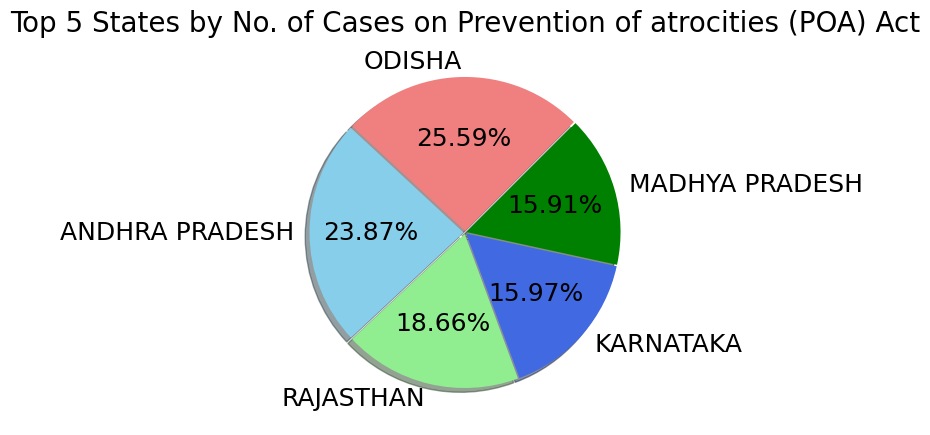

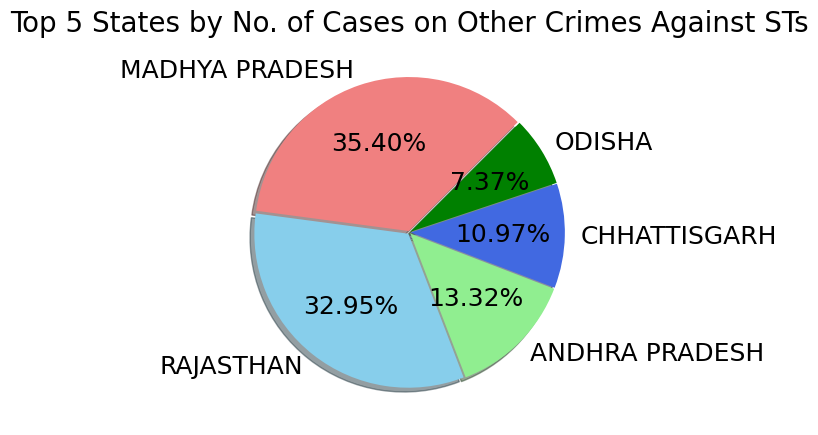

In [34]:
count=-1
for crime in crimes:
    count +=1
    top_crime_by_state=df_state.sort_values(by=crime,ascending=False)
    top_3crime=top_crime_by_state.iloc[:,count:count+1].head(5)
    plt.figure(figsize=(10,5))
    plt.pie(top_3crime[crime],labels=top_3crime.index,colors=['lightcoral','skyblue','lightgreen',"royalblue","green"],startangle=45,autopct='%1.2f%%',textprops={'fontsize': 18},shadow=True,explode=[0.01,0.01,0.01,0.01,0.01])
    plt.title("Top 5 States by No. of Cases on "+crime,fontdict={'fontsize' : 20})
    #plt.tight_layout()
    plt.show()

## Analysis of Top 5 States

In [35]:
top_5states=df_state.head(5).index
print(top_5states)

Index(['MADHYA PRADESH', 'RAJASTHAN', 'ANDHRA PRADESH', 'ODISHA',
       'CHHATTISGARH'],
      dtype='object', name='STATE/UT')


In [36]:
df_state

,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,Total
STATE/UT,,,,,,,,,,,
MADHYA PRADESH,537,3342,267,6,23,115,2776,3,1683,9390,18142
RAJASTHAN,180,471,71,0,9,113,1391,0,1974,8740,12949
ANDHRA PRADESH,99,451,48,0,3,19,1283,116,2525,3534,8078
ODISHA,106,428,81,6,38,41,985,4,2707,1954,6350
CHHATTISGARH,220,1132,63,16,9,19,620,5,930,2910,5924
...,...,...,...,...,...,...,...,...,...,...,...
Assam,0,0,0,0,0,0,0,0,0,0,0
Delhi UT,0,0,0,0,0,0,0,0,0,0,0
Lakshadweep,0,0,0,0,0,0,0,0,0,0,0


STATE/UT                              MADHYA PRADESH
Murder                                           537
Rape                                            3342
Kidnapping Abduction                             267
Dacoity                                            6
Robbery                                           23
Arson                                            115
Hurt                                            2776
Protection of Civil Rights (PCR) Act               3
Prevention of atrocities (POA) Act              1683
Other Crimes Against STs                        9390
Total                                          18142 

            STATE/UT   DISTRICT  Year  Murder  Rape  Kidnapping Abduction  \
303   MADHYA PRADESH   BALAGHAT  2001       1     6                     0   
304   MADHYA PRADESH    BARWANI  2001       2     3                     0   
305   MADHYA PRADESH      BETUL  2001       0    15                     0   
306   MADHYA PRADESH      BHIND  2001       0     1   

     STATE/UT       DISTRICT  Year  Murder  Rape  Kidnapping Abduction  \
436    ODISHA          ANGUL  2001       0     0                     0   
437    ODISHA       BALASORE  2001       0     0                     0   
438    ODISHA       BARAGARH  2001       0     0                     0   
439    ODISHA      BERHAMPUR  2001       0     0                     0   
440    ODISHA        BHADRAK  2001       0     0                     0   
...       ...            ...   ...     ...   ...                   ...   
8730   ODISHA      SAMBALPUR  2012       0     1                     1   
8731   ODISHA        SONEPUR  2012       0     3                     0   
8732   ODISHA   SRP(CUTTACK)  2012       0     0                     0   
8733   ODISHA  SRP(ROURKELA)  2012       0     0                     0   
8734   ODISHA     SUNDARGARH  2012       0     1                     0   

      Dacoity  Robbery  Arson  Hurt  Protection of Civil Rights (PCR) Act  \
436         0        0      0    5

ValueError: Grouper and axis must be same length

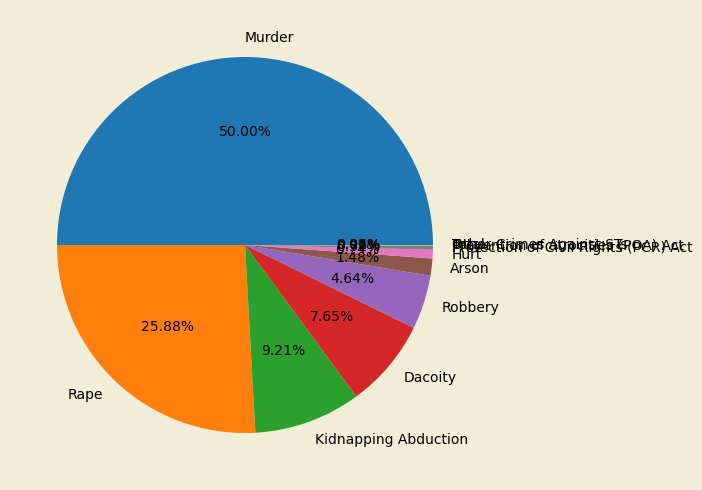

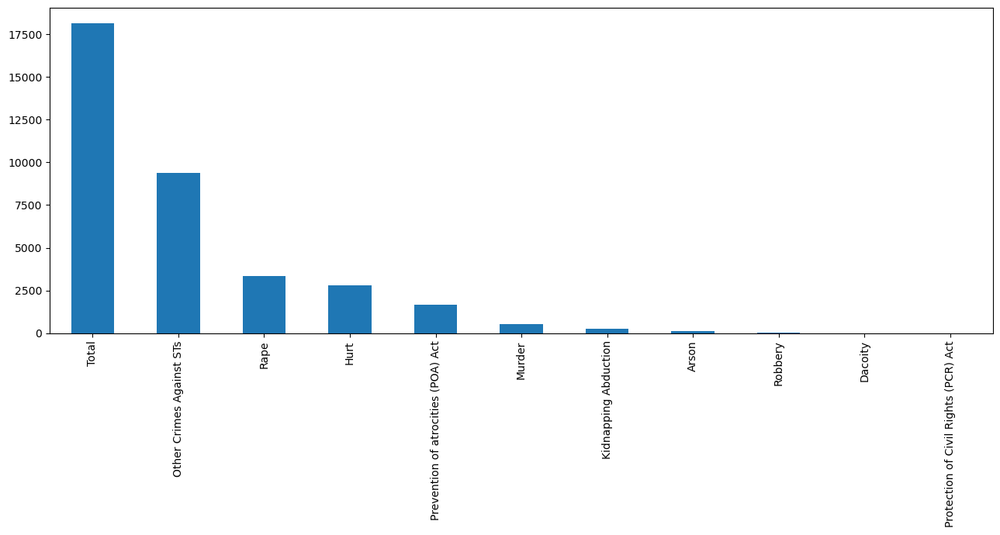

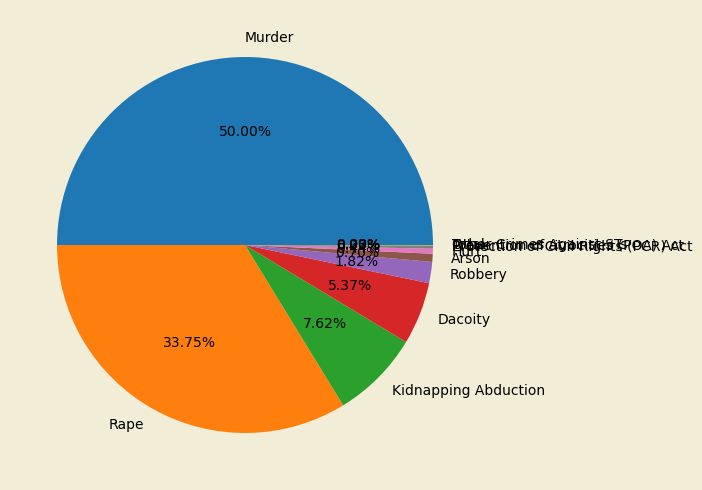

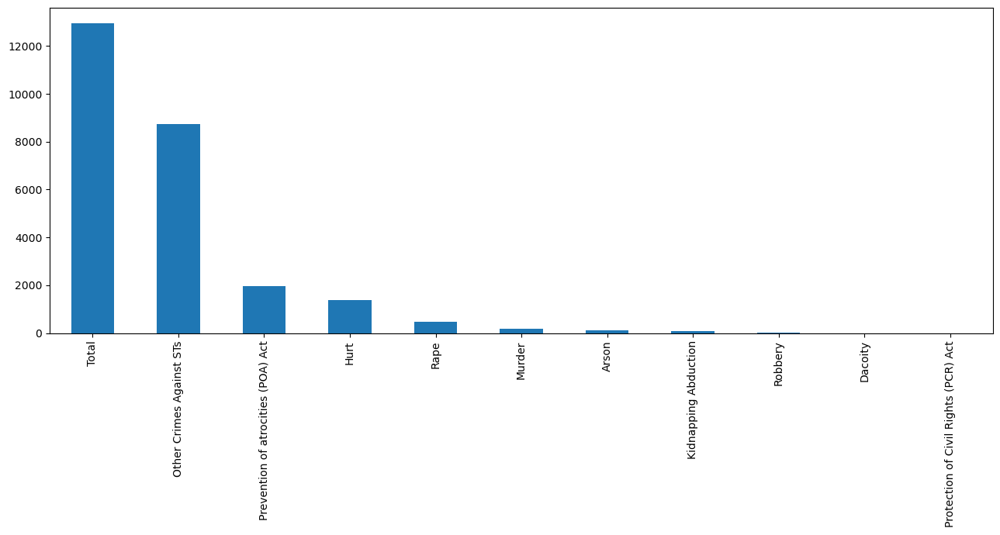

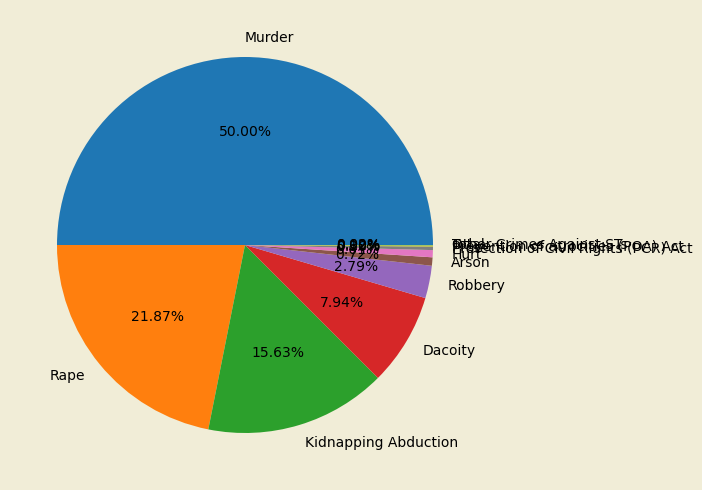

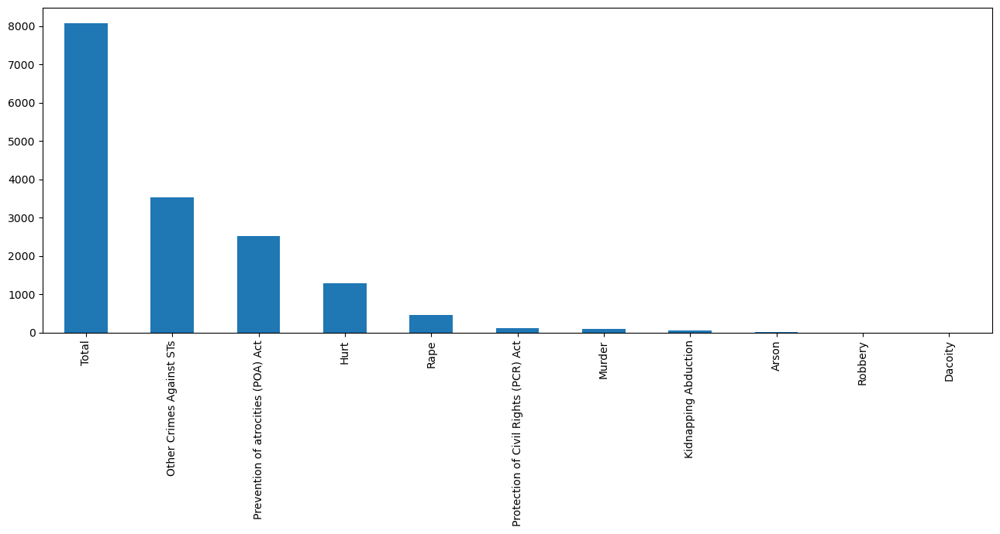

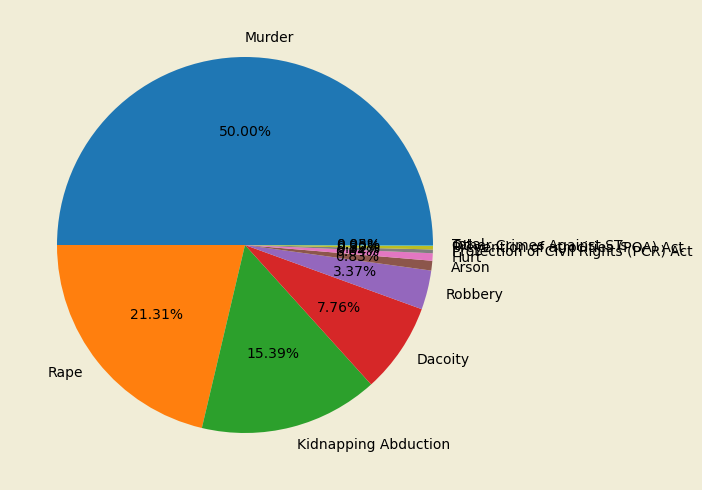

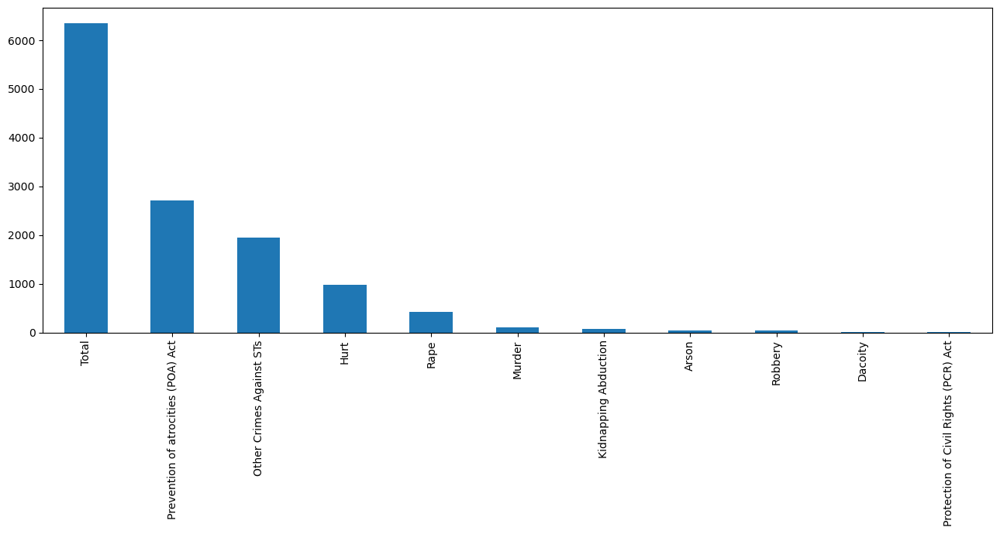

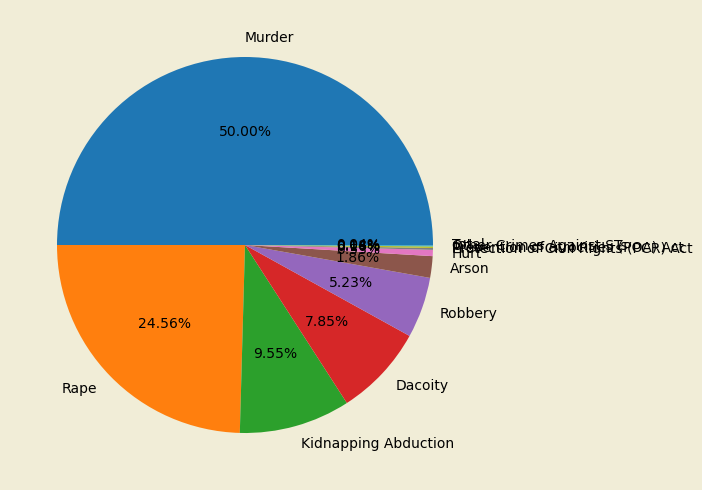

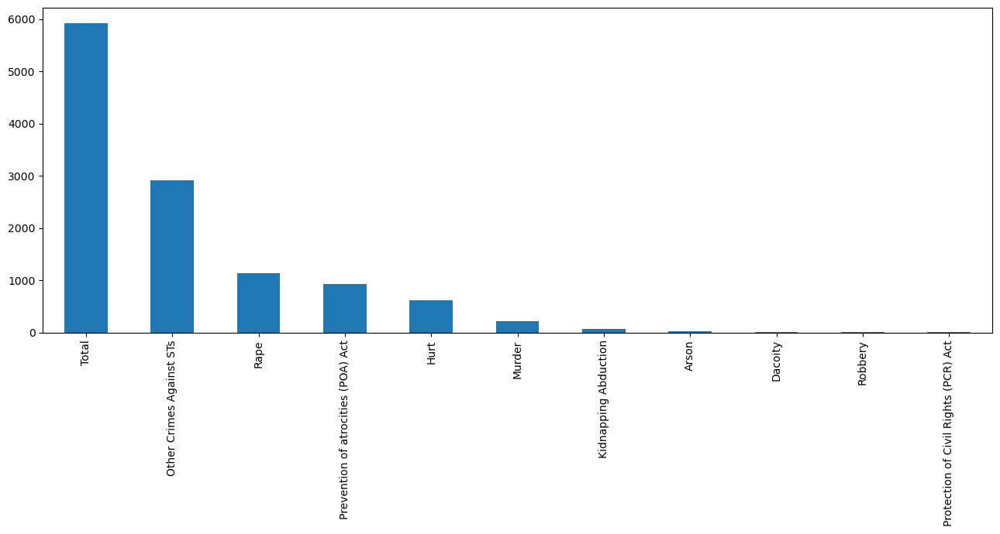

<Figure size 1000x500 with 0 Axes>

In [38]:
for state in top_5states:
    df_up=df_state.loc[df_state.index==state]
    dfupT=df_up.T#.drop("Total")
    print(dfupT,"\n")

  #Percentage Distribution of Crimes in Uttar Pradesh from 2001 to 2014
    plt.figure(figsize=(12,5)).patch.set_facecolor("#F1EDD7FF")
    plt.pie(dfupT[state].sort_values(ascending=False),labels=dfupT.index,autopct='%1.2f%%')
    plt.tight_layout()
    plt.figure(figsize=(13,7))
    dfupT.groupby(dfupT.index)[state].sum().sort_values(ascending=False).plot.bar()
    plt.tight_layout()

    df_state_year=Dist_df_crimes_final.loc[Dist_df_crimes_final['STATE/UT']==state]
    print(df_state_year,"\n")

  #Year Wise Distribution of Crimes in Uttar Pradesh
    df1_up_yearwise=pd.DataFrame()
    crimes_col=[x for x in crimes]
    #crimes_col.append("Total")
for i in crimes_col:
    df_crimes_up=df_state_year.groupby(['Year'])[i].sum()
    df1_up_yearwise[i]=df_crimes_up
    print(df1_up_yearwise)

    plt.figure(figsize=(10,5))
    sns.barplot(data=df1_up_yearwise,x=df1_up_yearwise.index,y=df_state["Total"],color="lightblue")
    plt.tight_layout()
  
  
    plt.figure(figsize=(10,5))
    sns.barplot(data=df1_up_yearwise,x=df1_up_yearwise.index,y=df_up[Total],color="lightblue")
    plt.tight_layout()

    plt.figure(figsize=(13,6)).patch.set_facecolor("#F1EDD7FF")
    plt.pie(df1_up_yearwise["Total"],labels=df1_up_yearwise.index,autopct='%1.2f%%',counterclock=False)
    plt.tight_layout()

  #Timeline Analysis of Different Categories of Crime at Different Period of Time
    plt.figure(figsize=(17,7)).patch.set_facecolor("#F1EDD7FF")
    sns.lineplot(data=df1_up_yearwise,palette='gnuplot_r',linestyle="dashed")
    plt.tight_layout()


In [39]:
print(df_up)

              Murder  Rape  Kidnapping Abduction  Dacoity  Robbery  Arson  \
STATE/UT                                                                    
CHHATTISGARH     220  1132                    63       16        9     19   

              Hurt  Protection of Civil Rights (PCR) Act  \
STATE/UT                                                   
CHHATTISGARH   620                                     5   

              Prevention of atrocities (POA) Act  Other Crimes Against STs  \
STATE/UT                                                                     
CHHATTISGARH                                 930                      2910   

              Total  
STATE/UT             
CHHATTISGARH   5924  


In [40]:
print(dfupT)

STATE/UT                              CHHATTISGARH
Murder                                         220
Rape                                          1132
Kidnapping Abduction                            63
Dacoity                                         16
Robbery                                          9
Arson                                           19
Hurt                                           620
Protection of Civil Rights (PCR) Act             5
Prevention of atrocities (POA) Act             930
Other Crimes Against STs                      2910
Total                                         5924
